## Transverse oscillations of two coupled identical masses

[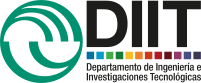](https://ingenieria.unlam.edu.ar/)    
[by-nc-sa_80x15.png](https://creativecommons.org/licenses/by-sa/4.0/) 
2025 [Víctor A. Bettachini](mailto:vbettachini@unlam.edu.ar)  

---

Two masses of identical mass are resting on a frictionless table, attached to the walls by springs with elastic constant $K_1$ and connected to each other by another spring with a different constant $K_2$. Find the frequencies and transverse modes of the system.

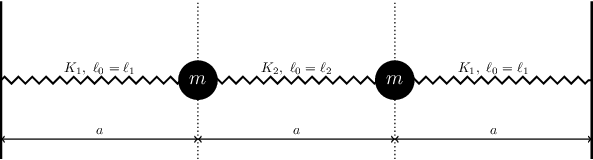

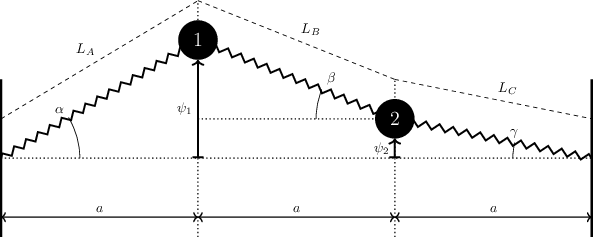

In [1]:
import sympy as sp
from sympy.physics.mechanics import init_vprinting
init_vprinting()

m,k1,k2,l1,l2,a=sp.symbols("m K_1 K_2 ell_1 ell_2 a",positive=True)
la,lb,lc=sp.symbols("L_a, L_b, L_c", positive=True)
alpha,beta,gamma=sp.symbols("alpha beta gamma",positive=True)
t=sp.symbols("t")
psi1=sp.Function("psi_1")(t)
psi2=sp.Function("psi_2")(t)

In [2]:
static=sp.Eq(k1*(a-l1),k2*(a-l2))
static

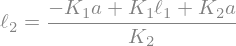

In [3]:
equation_length2=sp.Eq(l2,sp.solve(static,l2)[0])
equation_length2

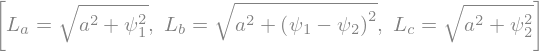

In [5]:
pythagorean=[sp.Eq(la,sp.sqrt(psi1**2+a**2)),
           sp.Eq(lb,sp.sqrt((psi1-psi2)**2+a**2)),
           sp.Eq(lc,sp.sqrt(psi2**2+a**2))]
pythagorean

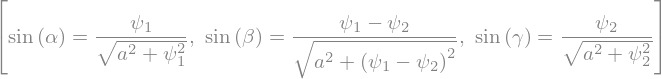

In [6]:
sines=[sp.Eq(sp.sin(alpha),psi1/pythagorean[0].rhs),
       sp.Eq(sp.sin(beta),(psi1-psi2)/pythagorean[1].rhs),
       sp.Eq(sp.sin(gamma),psi2/pythagorean[2].rhs)]
sines

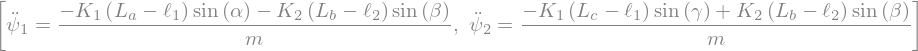

In [7]:
newton=[sp.Eq(sp.diff(psi1,t,2),(-k1*(la-l1)*sp.sin(alpha)-k2*(lb-l2)*sp.sin(beta))/m),
        sp.Eq(sp.diff(psi2,t,2),(-k1*(lc-l1)*sp.sin(gamma)+k2*(lb-l2)*sp.sin(beta))/m)]
newton

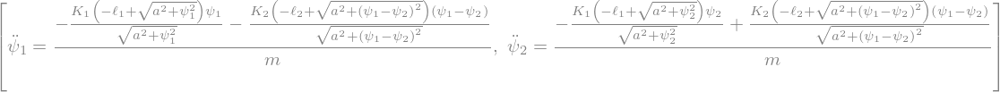

In [8]:
substitutions=[(sp.sin(alpha),sines[0].rhs),
               (sp.sin(beta),sines[1].rhs),
               (sp.sin(gamma),sines[2].rhs),
               (la,pythagorean[0].rhs),
               (lb,pythagorean[1].rhs),
               (lc,pythagorean[2].rhs)]

newton_subs=[newton[0].subs(substitutions),newton[1].subs(substitutions)]
newton_subs

In [9]:
def taylor_order1(f):
    return (f.subs([(psi1,0),(psi2,0)])
           +sp.diff(f,psi1).subs([(psi1,0),(psi2,0)])*psi1
           +sp.diff(f,psi2).subs([(psi1,0),(psi2,0)])*psi2)

In [10]:
pythagorean_lin=[]
for i in range(3):
    pythagorean_lin.append(sp.Eq(pythagorean[i].lhs, taylor_order1(pythagorean[i].rhs)))
pythagorean_lin

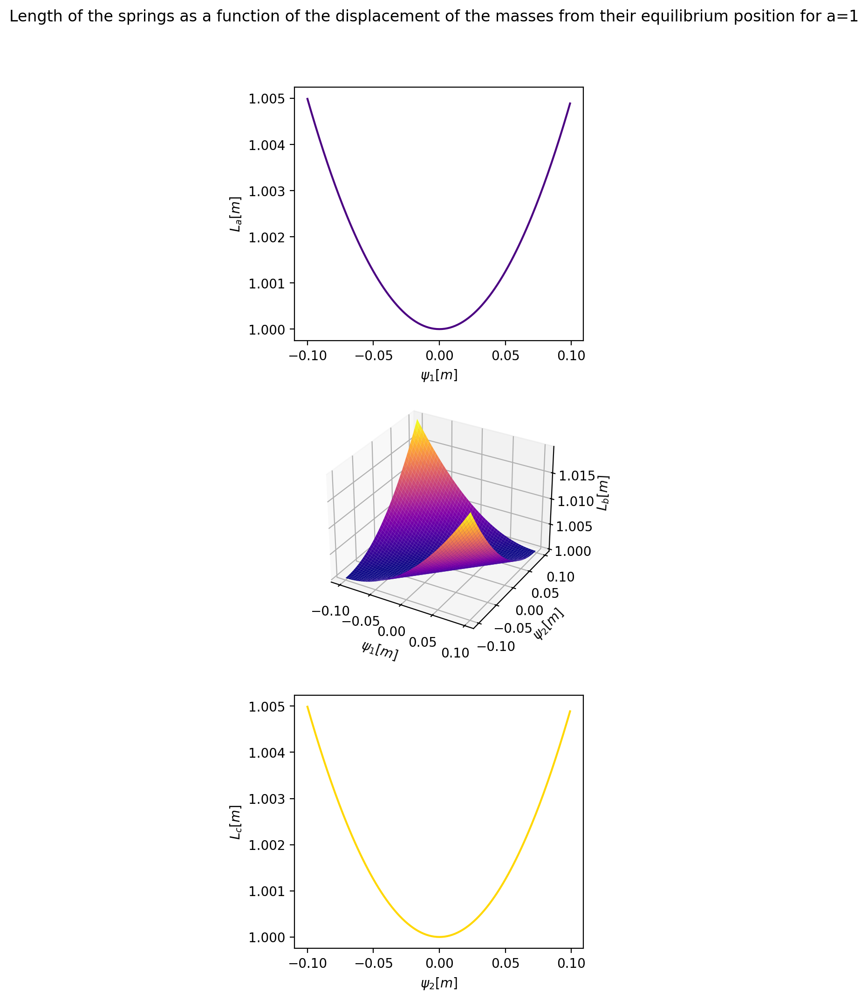

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm

a_sub=[(a,1)]
pitag1=sp.lambdify((psi1),pythagorean[0].rhs.subs(a_sub),"numpy")
pitag2=sp.lambdify((psi1,psi2),pythagorean[1].rhs.subs(a_sub),"numpy")
pitag3=sp.lambdify((psi2),pythagorean[2].rhs.subs(a_sub),"numpy")

PSI_1=np.arange(-0.1,0.1,0.001)
PSI_2=np.arange(-0.1,0.1,0.001)
PSI_1x=np.arange(-0.1,0.1,0.001)
PSI_2y=np.arange(-0.1,0.1,0.001)
PSI_1x,PSI_2y=np.meshgrid(PSI_1x,PSI_2y)

data1=pitag1(PSI_1)
data2=pitag2(PSI_1x,PSI_2y)
data3=pitag3(PSI_2)

fig = plt.figure(figsize=plt.figaspect(3.),dpi=200)
fig.suptitle("Length of the springs as a function of the displacement of the masses from their equilibrium position for a=1",y=0.95)

ax1 = fig.add_subplot(3, 1, 1)
ax1.plot(PSI_1,data1,"Indigo")
ax1.set_xlabel(r'$\psi_1[m]$')
ax1.set_ylabel(r'$L_a[m]$')

ax2 = fig.add_subplot(3, 1, 2, projection='3d')
ax2.plot_surface(PSI_1x,PSI_2y,data2,cmap=cm.plasma)
ax2.set_xlabel(r'$\psi_1[m]$')
ax2.set_ylabel(r'$\psi_2[m]$')
ax2.set_zlabel(r'$L_b[m]$')

ax3 = fig.add_subplot(3, 1, 3)
ax3.plot(PSI_2,data3,"gold")
ax3.set_xlabel(r'$\psi_2[m]$')
ax3.set_ylabel(r'$L_c[m]$')

plt.show()

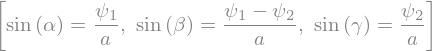

In [12]:
sines_lin=[sp.Eq(sp.sin(alpha),psi1/pythagorean_lin[0].rhs),
       sp.Eq(sp.sin(beta),(psi1-psi2)/pythagorean_lin[1].rhs),
       sp.Eq(sp.sin(gamma),psi2/pythagorean_lin[2].rhs)]
sines_lin

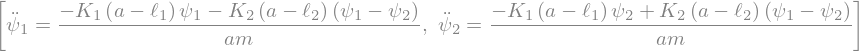

In [13]:
substitutions2=[(sp.sin(alpha),sines_lin[0].rhs),
               (sp.sin(beta),sines_lin[1].rhs),
               (sp.sin(gamma),sines_lin[2].rhs),
               (la,pythagorean_lin[0].rhs),
               (lb,pythagorean_lin[1].rhs),
               (lc,pythagorean_lin[2].rhs)]

newton_lin=[newton[0].subs(substitutions2).simplify(),newton[1].subs(substitutions2).simplify()]
newton_lin

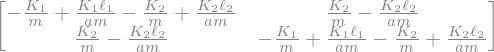

In [14]:
ma=sp.Matrix([[sp.expand(newton_lin[0].rhs).coeff(psi1),sp.expand(newton_lin[0].rhs).coeff(psi2)],
             [sp.expand(newton_lin[1].rhs).coeff(psi1),sp.expand(newton_lin[1].rhs).coeff(psi2)]])
ma

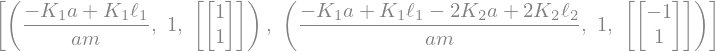

In [15]:
ma.eigenvects()

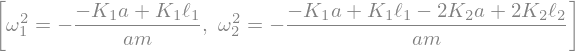

In [16]:
omega1,omega2=sp.symbols("omega_1,omega_2",positive=True)
frequencies=[sp.Eq(omega1**2,-ma.eigenvects()[0][0]),
             sp.Eq(omega2**2,-ma.eigenvects()[1][0])]

frequencies

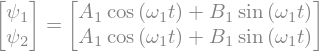

In [17]:
a1,b1=sp.symbols("A_1 B_1")

mode1=sp.Eq(sp.Matrix([psi1,psi2]),ma.eigenvects()[0][2][0]*(a1*sp.cos(omega1*t)+b1*sp.sin(omega1*t)))
mode1

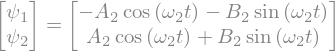

In [18]:
a2,b2=sp.symbols("A_2 B_2")
mode2=sp.Eq(sp.Matrix([psi1,psi2]),ma.eigenvects()[1][2][0]*(a2*sp.cos(omega2*t)+b2*sp.sin(omega2*t)))
mode2

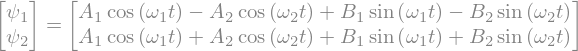

In [19]:
sol=sp.Eq(sp.Matrix([psi1,psi2]),mode1.rhs+mode2.rhs)
sol

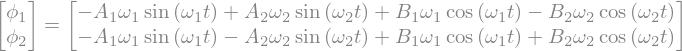

In [20]:
phi1,phi2=sp.symbols("phi_1 phi_2")
vel=sp.Eq(sp.Matrix([phi1,phi2]),sp.diff(sol.rhs,t))
vel

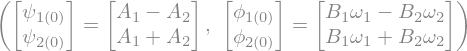

In [21]:
p01,p02,v01,v02=sp.symbols("psi_1(0) psi_2(0) phi_1(0) phi_2(0)")
substitution=[(psi1,p01),(psi2,p02),(phi1,v01),(phi2,v02),(t,0)]
sist_init=sol.subs(substitution),vel.subs(substitution)
sist_init

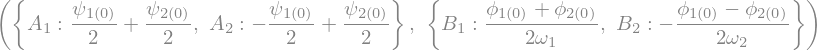

In [22]:
coeffsA=sp.solve(sist_init[0])
coeffsB=sp.solve(sist_init[1])[0]
coeffsA,coeffsB

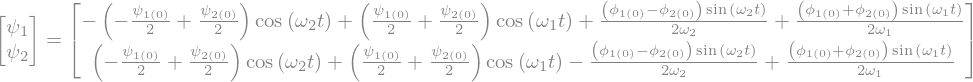

In [23]:
subs=[(a1,coeffsA[a1]),(a2,coeffsA[a2]),(b1,coeffsB[b1]),(b2,coeffsB[b2])]
solution=sol.subs(subs)
solution

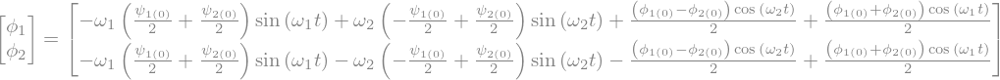

In [24]:
velocity=vel.subs(subs)
velocity

In [25]:
const_system=[(k1,10),(k2,5),(m,0.5),(l1,0.1),(a,1)]
constans_system=const_system+[(l2,equation_length2.rhs.subs(const_system))]
constans_system

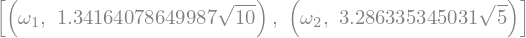

In [26]:
freqs_values=[(omega1,sp.sqrt(frequencies[0].rhs).subs(constans_system)),
                 (omega2,sp.sqrt(frequencies[1].rhs).subs(constans_system))]
freqs_values

### Mode 1

In [27]:
initial=([(p01,0.2),(p02,0.2),(v01,0),(v02,0)])
initial

In [28]:
position1=sp.lambdify(t,solution.rhs[0].subs(constans_system+freqs_values+initial),"numpy")
position2=sp.lambdify(t,solution.rhs[1].subs(constans_system+freqs_values+initial),"numpy")
time=np.arange(0,30,0.1)

In [30]:
%%capture

from matplotlib.animation import FuncAnimation

figure_1, axes_1 = plt.subplots(figsize=(8,3))

axes_1.set_aspect("equal")
axes_1.set_xlim(-8,8)
axes_1.set_ylim(-2.5,2.5)
axes_1.set_xticks(np.arange(-7.5,7.5,1))
axes_1.set_yticks(np.arange(-2.5,2.5,1))
supportL,=axes_1.plot([-7.5,-7.5],[-2,2],"k",markersize=4)
supportR,=axes_1.plot([7.5,7.5],[-2,2],"k",markersize=4)
equilibrium,=axes_1.plot([-2.5,2.5],[0,0],'r+')
masses,=axes_1.plot([],[],'ko',markersize=10)
springa,=axes_1.plot([],[],"k-.")
springb,=axes_1.plot([],[],"k-.")
springc,=axes_1.plot([],[],"k-.")

def frame(t):
    a=position1(t)
    b=position2(t)
    springa.set_xdata([-7.5,-2.5])
    springa.set_ydata([0,a])
    springb.set_xdata([-2.5,2.5])
    springb.set_ydata([a,b])
    springc.set_xdata([2.5,7.5])
    springc.set_ydata([b,0])
    masses.set_xdata([-2.5,2.5])
    masses.set_ydata([a,b])
    return 

animat = FuncAnimation(figure_1,func=frame,frames=time,interval=100)

In [31]:
from IPython.display import HTML
from matplotlib import animation, rc

rc('animation', html='jshtml')
animat

### Mode 2

In [32]:
initial=([(p01,0.2),(p02,-0.2),(v01,0),(v02,0)])
initial

In [33]:
position1=sp.lambdify(t,solution.rhs[0].subs(constans_system+freqs_values+initial),"numpy")
position2=sp.lambdify(t,solution.rhs[1].subs(constans_system+freqs_values+initial),"numpy")

In [34]:
%%capture

from matplotlib.animation import FuncAnimation

figure_1, axes_1 = plt.subplots(figsize=(8,3))

axes_1.set_aspect("equal")
axes_1.set_xlim(-8,8)
axes_1.set_ylim(-2.5,2.5)
axes_1.set_xticks(np.arange(-7.5,7.5,1))
axes_1.set_yticks(np.arange(-2.5,2.5,1))
supportL,=axes_1.plot([-7.5,-7.5],[-2,2],"k",markersize=4)
supportR,=axes_1.plot([7.5,7.5],[-2,2],"k",markersize=4)
equilibrium,=axes_1.plot([-2.5,2.5],[0,0],'r+')
masses,=axes_1.plot([],[],'ko',markersize=10)
springa,=axes_1.plot([],[],"k-.")
springb,=axes_1.plot([],[],"k-.")
springc,=axes_1.plot([],[],"k-.")

def frame(t):
    a=position1(t)
    b=position2(t)
    springa.set_xdata([-7.5,-2.5])
    springa.set_ydata([0,a])
    springb.set_xdata([-2.5,2.5])
    springb.set_ydata([a,b])
    springc.set_xdata([2.5,7.5])
    springc.set_ydata([b,0])
    masses.set_xdata([-2.5,2.5])
    masses.set_ydata([a,b])
    return 

animat = FuncAnimation(figure_1,func=frame,frames=time,interval=100)

In [35]:
rc('animation', html='jshtml')
animat